In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Setting up Detectron2

In [2]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 8.6 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15837, done.
remote: Counting objects: 100% (65/65), done.
remote: Compressing objects: 100% (51/51), done.
remote: Total 15837 (delta 35), reused 14 (delta 14), pack-reused 15772 (from 2)
Receiving objects: 100% (15837/15837), 6.41 MiB | 10.83 MiB/s, done.
Resolving deltas: 100% (11533/11533), done.
Ignoring dataclasses: markers 'python_version < "3.7"' don't match your e

In [3]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0
torch:  2.5 ; cuda:  cu124
detectron2: 0.6


In [4]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow
import random

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

## Setting up the Dataset

In [5]:
%%shell
curl -L "https://public.roboflow.com/ds/9QlWTc2s2x?key=baX0ENPzeQ" > roboflow.zip
mkdir /content/dataset/
unzip roboflow.zip -d /content/dataset/
rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   2561      0 --:--:-- --:--:-- --:--:--  2566
100 46.4M  100 46.4M    0     0  24.9M      0  0:00:01  0:00:01 --:--:-- 47.0M
Archive:  roboflow.zip
 extracting: /content/dataset/README.dataset.txt  
 extracting: /content/dataset/README.roboflow.txt  
   creating: /content/dataset/test/
 extracting: /content/dataset/test/_annotations.coco.json  
 extracting: /content/dataset/test/img-105_jpg.rf.3fe9dff3d1631e79ecb480ff403bcb86.jpg  
 extracting: /content/dataset/test/img-107_jpg.rf.2e40485785f6e5e2efec404301b235c2.jpg  
 extracting: /content/dataset/test/img-146_jpg.rf.61be25b3053a51f622a244980545df2b.jpg  
 extracting: /content/dataset/test/img-161_jpg.rf.211541e7178a4a93ec0680f26b905427.jpg  
 extracting: /content/dataset/test/img-168_jpg.rf.af3590e07b06b43e91fa53990ff94af3.jpg  
 extracting: /con

In [6]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("pothole_train", {}, "/content/dataset/train/_annotations.coco.json", \
                        "/content/dataset/train")
register_coco_instances("pothole_val", {}, "/content/dataset/valid/_annotations.coco.json", \
                        "/content/dataset/valid")
register_coco_instances("pothole_test", {}, "/content/dataset/test/_annotations.coco.json", \
                        "/content/dataset/test")

WARNING [02/27 16:20:35 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/27 16:20:35 d2.data.datasets.coco]: Loaded 465 images in COCO format from /content/dataset/train/_annotations.coco.json
[{'file_name': '/content/dataset/train/img-80_jpg.rf.02752f42e0f4bc24481a8d9d938a7569.jpg', 'height': 720, 'width': 720, 'image_id': 0, 'annotations': [{'iscrowd': 0, 'bbox': [215, 225, 233, 195], 'category_id': 1, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}, {'file_name': '/content/dataset/train/img-235_jpg.rf.030dcf4264c55859ef30294c84f77482.jpg', 'height': 720, 'width': 720, 'image_id': 1, 'annotations': [{'iscrowd': 0, 'bbox': [227, 196, 275, 267], 'category_id': 1, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}, {'file_name': '/content/dataset/train/img-110_jpg.rf.0390f81a2c5b2ad5676a8eb5b043d743.jpg', 'height': 720, 'width': 720, 'image_id': 2, 'annotations': [{'iscrowd': 0, 'bbox': [223, 289, 414, 121], 'category_id': 1, 'bbox_mode': <B

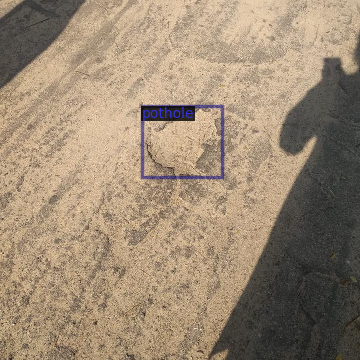

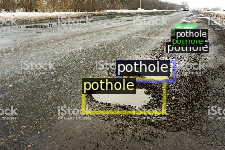

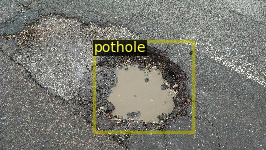

In [7]:
#visualize training data
pothole_metadata = MetadataCatalog.get("pothole_train")
dataset_dicts = DatasetCatalog.get("pothole_train")
print(dataset_dicts[:5])

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=pothole_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Fine Tuning

In [8]:
from detectron2.engine import DefaultTrainer

# Set up the configuration
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")

cfg.DATASETS.TRAIN = ("pothole_train",)
cfg.DATASETS.TEST = ("pothole_val",)  # Assuming you want to use a validation set
cfg.DATALOADER.NUM_WORKERS = 2

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 1599
cfg.SOLVER.STEPS = []

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # Assuming you have potholes as one class and background as another

cfg.OUTPUT_DIR = "./output"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Initialize and train the trainer
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[02/27 16:20:37 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:01, 98.9MB/s]                          
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[02/27 16:20:39 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.11/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[02/27 16:20:51 d2.utils.events]:  eta: 0:10:56  iter: 19  total_loss: 1.388  loss_cls: 1.074  loss_box_reg: 0.0766  loss_rpn_cls: 0.1884  loss_rpn_loc: 0.02891    time: 0.4050  last_time: 0.5157  data_time: 0.0203  last_data_time: 0.0138   lr: 4.9953e-06  max_mem: 2444M
[02/27 16:21:03 d2.utils.events]:  eta: 0:11:03  iter: 39  total_loss: 1.171  loss_cls: 0.9523  loss_box_reg: 0.1021  loss_rpn_cls: 0.1059  loss_rpn_loc: 0.01451    time: 0.4105  last_time: 0.2609  data_time: 0.0088  last_data_time: 0.0049   lr: 9.9902e-06  max_mem: 2545M
[02/27 16:21:12 d2.utils.events]:  eta: 0:11:07  iter: 59  total_loss: 1.053  loss_cls: 0.726  loss_box_reg: 0.1453  loss_rpn_cls: 0.115  loss_rpn_loc: 0.01838    time: 0.4147  last_time: 0.2891  data_time: 0.0127  last_data_time: 0.0055   lr: 1.4985e-05  max_mem: 2635M
[02/27 16:21:20 d2.utils.events]:  eta: 0:10:46  iter: 79  total_loss: 0.8217  loss_cls: 0.5234  loss_box_reg: 0.127  loss_rpn_cls: 0.1153  loss_rpn_loc: 0.0218    time: 0.4151  last_t

## Visualizing Training

In [9]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Inference & Evaluation

In [10]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
!ls ./output/

events.out.tfevents.1740673255.419f152432a2.232.0  last_checkpoint  metrics.json  model_final.pth


In [11]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("pothole_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "pothole_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[02/27 16:32:26 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


/usr/local/lib/python3.11/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

[02/27 16:32:26 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [02/27 16:32:26 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [02/27 16:32:26 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/27 16:32:26 d2.data.datasets.coco]: Loaded 67 images in COCO format from /content/dataset/test/_annotations.coco.json
[02/27 16:32:26 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|  potholes  | 0            |  pothole   | 154          |
|            |              |            |              |
|   total    | 154          |            |              |
[02/27 16:32:26 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in infere

OrderedDict([('bbox',
              {'AP': 41.486504539546566,
               'AP50': 65.99359730093059,
               'AP75': 46.592115921944874,
               'APs': 20.900920775785522,
               'APm': 36.659089006721125,
               'APl': 53.35596468655203,
               'AP-potholes': nan,
               'AP-pothole': 41.486504539546566})])

In [12]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[02/27 16:32:34 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


/usr/local/lib/python3.11/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

WARNING [02/27 16:32:35 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/27 16:32:35 d2.data.datasets.coco]: Loaded 67 images in COCO format from /content/dataset/test/_annotations.coco.json


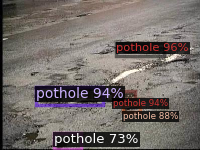

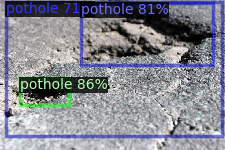

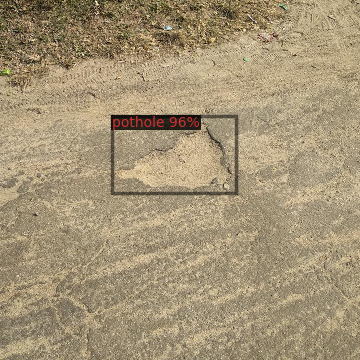

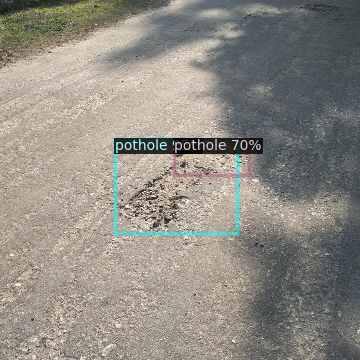

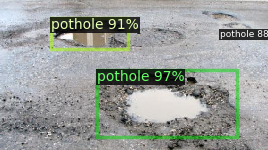

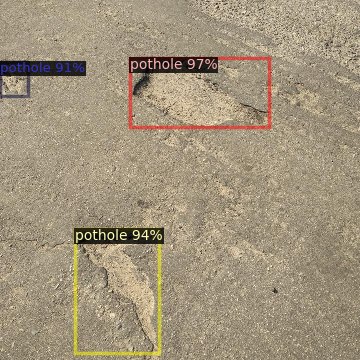

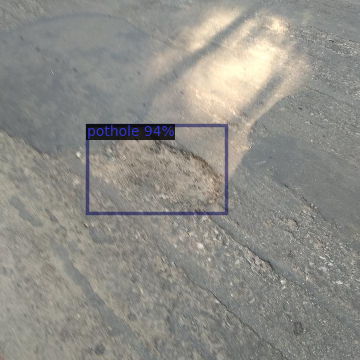

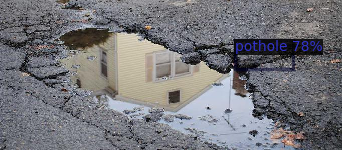

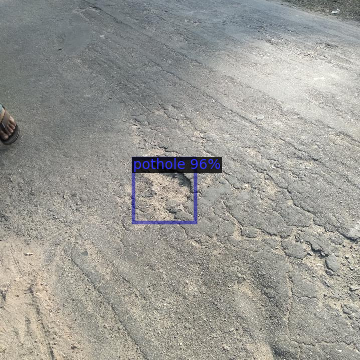

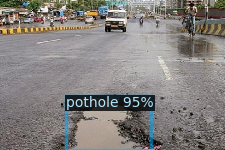

In [13]:
from detectron2.utils.visualizer import ColorMode
pothole_metadata = MetadataCatalog.get("pothole_test")
dataset_dicts = DatasetCatalog.get("pothole_test")

for d in random.sample(dataset_dicts, 10):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=pothole_metadata,
                   scale=0.5
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [14]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("pothole_test", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "pothole_test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[02/27 16:32:36 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [02/27 16:32:36 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/27 16:32:36 d2.data.datasets.coco]: Loaded 67 images in COCO format from /content/dataset/test/_annotations.coco.json
[02/27 16:32:36 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[02/27 16:32:36 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[02/27 16:32:36 d2.data.common]: Serializing 67 elements to byte tensors and concatenating them all ...
[02/27 16:32:36 d2.data.common]: Serialized dataset takes 0.02 MiB
[02/27 16:32:36 d2.evaluation.evaluator]: Start inference on 67 batches
[02/27 16:32:38 d2.evaluation.evaluator]: Inference done 14/67. Dataloading: 0.0024 s/i

In [15]:
%%shell
mkdir -p "/content/drive/MyDrive/ML Projects"
cp ./output/model_final.pth "/content/drive/MyDrive/ML Projects/rcnn_50_final.pth"